# 🎯 Object Detection with YOLO

### AI Builders Bootcamp — Computer Vision · Session 05

---

In the previous session we built a **CNN classifier** that answered one question:

> *"Is this a cat or a dog?"*

Today we move one big step forward. We will use **YOLO** — a pretrained object
detection model — to find **many objects at once**, tell us **where** they are,
and tell us **how sure** it is.

**By the end of this notebook you will be able to:**

| # | Skill |
|---|-------|
| 1 | Load a pretrained YOLO model |
| 2 | Run it on an image (*inference*) |
| 3 | Read the raw prediction object it returns |
| 4 | Pull out bounding boxes, class labels and confidence scores |
| 5 | Draw the boxes yourself with OpenCV |
| 6 | Tune the confidence threshold and explain the trade-off |

> ⚠️ We are **not** implementing YOLO from scratch. We are learning to *use*
> it — the way an AI engineer actually works day to day.

---

# 1 · What is object detection?

## Classification vs. Detection

**Classification** (what we did last session) answers:

> ### *"What is in this image?"*

It gives you **one label for the whole image**. If the picture contains a dog
*and* a bicycle *and* a truck, a classifier still has to pick just one answer.

**Object detection** answers a much richer question:

> ### *"What objects are in this image, where are they, and how confident is the model?"*

### The pipeline we are building today

```text
                    Image
                      │
                      ▼
                    YOLO
                      │
                      ▼
              Object detections
                      │
                      ▼
    ┌─────────────────────────────────┐
    │  Person     0.94                │
    │  Laptop     0.87                │
    │  Bottle     0.72                │
    └─────────────────────────────────┘
       label      confidence   (+ a box for each one)
```

Every single row in that table is **one detection**, and every detection is
made of exactly three things.

## The three ingredients of a detection

| Ingredient | Question it answers | Example |
|---|---|---|
| 📦 **Bounding box** | **Where?** | `x1=131, y1=219, x2=309, y2=541` |
| 🏷️ **Class / label** | **What?** | `dog` |
| 📊 **Confidence score** | **How sure?** | `0.91` → 91 % |

Memorise this — the whole notebook is just these three things, over and over:

```text
ONE DETECTION  =  bounding box  +  class  +  confidence
```

### 📦 A bounding box, visually

A bounding box is just **4 numbers** describing a rectangle in *pixel*
coordinates:

```text
   (x1, y1)  ← top-left corner
      ┌─────────────────────┐
      │                     │
      │       OBJECT        │
      │                     │
      └─────────────────────┘
                        (x2, y2)  ← bottom-right corner
```

Remember that in images the origin `(0, 0)` is the **top-left** of the picture,
`x` grows to the **right** and `y` grows **downward**.

### 🏷️ A class

YOLO models are trained on a fixed list of object categories. The model we use
today knows **80 everyday classes** (person, car, dog, bottle, laptop, …).
It can only detect things that are on that list.

### 📊 A confidence score

A number between `0.0` and `1.0` saying how sure the model is about a
detection. We usually show it as a percentage: `0.91 → 91 %`.

> 💡 **We are deliberately *not* covering** how YOLO works inside (its layers,
> its loss function, anchor boxes, NMS maths). Today is about **using** the
> model well.

---

# 2 · Install and import

We use **Ultralytics YOLO** — the most popular, best-supported YOLO package.
It gives us a one-line model loader and a one-line inference call.

Run the cell below **only if** `ultralytics` is not installed yet.
After installing, restart the kernel.

In [1]:
# ── Install (run once, then restart the kernel) ───────────────────────────
# Uncomment the next line if you do not have the packages yet:

# %pip install ultralytics opencv-python matplotlib

# `ultralytics` also pulls in PyTorch automatically.

### Our imports — and why we need each one

In [2]:
from ultralytics import YOLO      # the YOLO model itself (load + run)
import cv2                        # OpenCV: read images, draw rectangles and text
import matplotlib.pyplot as plt   # display images inside the notebook
import numpy as np                # arrays / small numeric helpers

# Show matplotlib figures directly under each cell
%matplotlib inline

# Nicer default figure size for teaching
plt.rcParams["figure.figsize"] = (10, 7)

print("✅ Imports OK")
print("OpenCV version     :", cv2.__version__)

✅ Imports OK
OpenCV version     : 5.0.0


### One small helper we will reuse everywhere

OpenCV loads images as **BGR** (Blue-Green-Red), but Matplotlib expects
**RGB**. If we forget to convert, everything looks blue!

So we write **one** helper function now and reuse it in every section.

In [3]:
def show(image_bgr, title="", figsize=(10, 7)):
    '''Display an OpenCV (BGR) image inside the notebook.

    Parameters
    ----------
    image_bgr : np.ndarray  -> image in OpenCV's BGR channel order
    title     : str         -> title printed above the image
    '''
    plt.figure(figsize=figsize)
    # BGR -> RGB, otherwise colours are wrong in matplotlib
    plt.imshow(cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB))
    plt.title(title, fontsize=13, fontweight="bold")
    plt.axis("off")          # pixel axes are noise for us here
    plt.tight_layout()
    plt.show()


print("✅ Helper `show()` ready")

✅ Helper `show()` ready


---

# 3 · Load a pretrained YOLO model

> **We are not training a model today.** We are using a model that has
> **already learned** to detect common objects — someone else spent GPU-days
> training it, and we get to use the result in one line.

### Three words you must not mix up

| Word | Meaning | Do we do it today? |
|---|---|---|
| **Training** | Showing the model thousands of labelled images so it *learns* the weights | ❌ No |
| **Pretrained model** | A file of weights that already finished training | ✅ We download one |
| **Inference** | Using the finished model to *predict* on a new image | ✅ This is our whole session |

We load `yolov8n.pt` — the **n**ano version. It is the smallest and fastest,
which makes it perfect for a live class on a laptop CPU.

In [4]:
# The first time you run this, the weights file (~6 MB) is downloaded
# automatically and cached. After that it loads instantly from disk.
model = YOLO("yolov8n.pt")

print("✅ Pretrained YOLO model loaded")

✅ Pretrained YOLO model loaded


### What does this model actually know?

A detection model can only find classes it was trained on. Let's look at that
list — it is stored in `model.names`, a dictionary `{class_id: class_name}`.

In [5]:
# model.names maps a numeric class ID -> a human-readable name
class_names = model.names

print(f"The model knows {len(class_names)} classes.\n")

# Peek at the first few IDs
for class_id in range(5):
    print(f"  ID {class_id:2d}  ->  {class_names[class_id]}")

print("\nAll 80 classes:")
print("-" * 68)
# Print them in a tidy grid so students can scan the list
all_names = [class_names[i] for i in range(len(class_names))]
for row_start in range(0, len(all_names), 5):
    print("".join(f"{n:<16}" for n in all_names[row_start:row_start + 5]))

The model knows 80 classes.

  ID  0  ->  person
  ID  1  ->  bicycle
  ID  2  ->  car
  ID  3  ->  motorcycle
  ID  4  ->  airplane

All 80 classes:
--------------------------------------------------------------------
person          bicycle         car             motorcycle      airplane        
bus             train           truck           boat            traffic light   
fire hydrant    stop sign       parking meter   bench           bird            
cat             dog             horse           sheep           cow             
elephant        bear            zebra           giraffe         backpack        
umbrella        handbag         tie             suitcase        frisbee         
skis            snowboard       sports ball     kite            baseball bat    
baseball glove  skateboard      surfboard       tennis racket   bottle          
wine glass      cup             fork            knife           spoon           
bowl            banana          apple           sand

👀 **Look at that list.** Notice what is *there* (person, dog, bicycle, laptop,
bottle…) and what is *not* (your face, a specific brand, a tumour, a licence
plate). If you need those, you would have to **train** or **fine-tune** —
that is a later session.

---

# 4 · Load and display our image

We deliberately pick an image with **several different objects** in it, not
just one — that is the whole point of detection.

Loaded  : dog.jpg
Shape   : (576, 768, 3)   ->  height=576, width=768, channels=3
Type    : ndarray, dtype=uint8


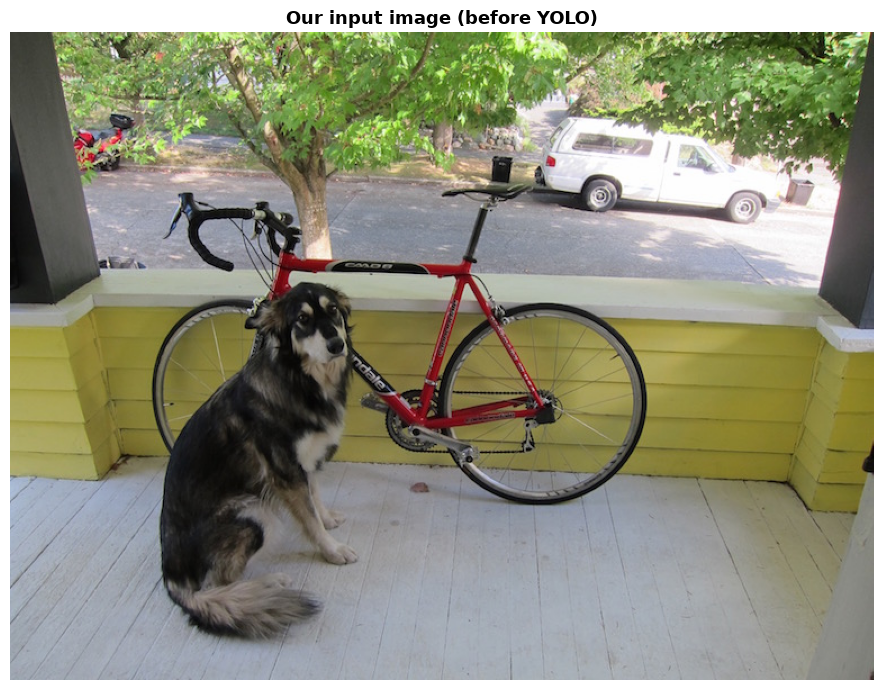

In [6]:
IMAGE_PATH = "dog.jpg"

# cv2.imread returns a NumPy array of shape (height, width, 3) in BGR order
image = cv2.imread(IMAGE_PATH)

# Always check the load succeeded - imread returns None on a bad path
if image is None:
    raise FileNotFoundError(f"Could not read '{IMAGE_PATH}'. Is it next to this notebook?")

height, width, channels = image.shape
print(f"Loaded  : {IMAGE_PATH}")
print(f"Shape   : {image.shape}   ->  height={height}, width={width}, channels={channels}")
print(f"Type    : {type(image).__name__}, dtype={image.dtype}")

show(image, "Our input image (before YOLO)")

## ✋ Pause — predict before you run!

> ### Before running YOLO, **what objects do you expect the model to detect?**

Write your guesses down (or shout them out):

1. How many objects will it find?
2. Which classes from the list of 80?
3. Which object will get the **highest** confidence? Which the **lowest**?
4. Is there anything in the image that YOLO **cannot** detect, because it is
   not in its 80 classes?

Keep your guesses — we will check them in a moment.

---

# 5 · Run YOLO inference

This is the entire "run the AI model" step. One line:

```python
results = model(image)
```

That is it. No preprocessing, no resizing, no normalising — Ultralytics does
all of that for us internally.

In [7]:
# Run the model on our image.
# `verbose=False` just hides Ultralytics' own console log so the output is clean.
results = model(image, verbose=False)

print("Inference done ✅")
print("Type of `results` :", type(results))
print("Length of `results`:", len(results))

Inference done ✅
Type of `results` : <class 'list'>
Length of `results`: 1


### Why is `results` a *list*?

Because YOLO can process **a batch of images** in one call. We passed **one**
image, so we get a list with **one** result object in it.

```text
model([img1, img2, img3])  ->  [Results, Results, Results]
model(img1)                ->  [Results]          ← our case
```

So we grab the first (and only) element:

In [8]:
# One image in -> one Results object out
result = results[0]

# Printing the whole object dumps a LOT - it even contains the raw pixels.
# So we look at just the first few lines of it:
print(str(result)[:430])
print("   ... (truncated)")

ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
depth: None
keypoints: None
masks: None
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow',
   ... (truncated)


That printout is dense — that is fine. The important message is:

> `result` is a **structured object**, not a picture. It holds the raw
> numbers YOLO predicted. Drawing them on the image is a *separate*, later
> step that **we** control.

Let's see what is inside it.

In [9]:
# The interesting attributes on a Results object
print("result.boxes       ->", type(result.boxes).__name__, " (all the detections)")
print("result.names       ->", type(result.names).__name__, " (id -> class name map)")
print("result.orig_shape  ->", result.orig_shape, " (original image height, width)")
speed = {stage: f"{ms:.1f} ms" for stage, ms in result.speed.items()}
print("result.speed       ->", speed, " (time per stage)")

result.boxes       -> Boxes  (all the detections)
result.names       -> dict  (id -> class name map)
result.orig_shape  -> (576, 768)  (original image height, width)
result.speed       -> {'preprocess': '4.1 ms', 'inference': '201.1 ms', 'postprocess': '2.9 ms'}  (time per stage)


---

# 6 · Explore the detection results 🔍

**This is the most important section of the notebook.**

Everything YOLO found lives in `result.boxes`. Let's open it up.

In [10]:
boxes = result.boxes

print("How many objects did YOLO detect?  ->", len(boxes))
print()
print(boxes)

How many objects did YOLO detect?  -> 4

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([16.,  1.,  2.,  7.])
conf: tensor([0.9080, 0.8888, 0.5306, 0.5086])
data: tensor([[1.3111e+02, 2.1989e+02, 3.0925e+02, 5.4184e+02, 9.0800e-01, 1.6000e+01],
        [1.3063e+02, 1.3961e+02, 5.6827e+02, 4.2085e+02, 8.8876e-01, 1.0000e+00],
        [4.6749e+02, 7.4809e+01, 6.9209e+02, 1.7167e+02, 5.3059e-01, 2.0000e+00],
        [4.6716e+02, 7.4549e+01, 6.9261e+02, 1.7178e+02, 5.0861e-01, 7.0000e+00]])
id: None
is_track: False
orig_shape: (576, 768)
shape: torch.Size([4, 6])
xywh: tensor([[220.1822, 380.8633, 178.1453, 321.9458],
        [349.4525, 280.2315, 437.6385, 281.2360],
        [579.7911, 123.2380, 224.5970,  96.8579],
        [579.8826, 123.1661, 225.4478,  97.2342]])
xywhn: tensor([[0.2867, 0.6612, 0.2320, 0.5589],
        [0.4550, 0.4865, 0.5698, 0.4883],
        [0.7549, 0.2140, 0.2924, 0.1682],
        [0.7551, 0.2138, 0.2936, 0.1688]])
xyxy: tensor([[131.1096, 219

### The three arrays you will use 99 % of the time

| Attribute | Shape | Meaning |
|---|---|---|
| `boxes.xyxy` | `(N, 4)` | the **box** corners: `x1, y1, x2, y2` in pixels |
| `boxes.conf` | `(N,)` | the **confidence** of each detection, `0.0 – 1.0` |
| `boxes.cls`  | `(N,)` | the **class ID** of each detection (a float, e.g. `16.0`) |

where `N` = number of detected objects.

Each row `i` of these arrays describes **the same object**:

```text
        xyxy[0]              conf[0]      cls[0]
   [131, 219, 309, 541]       0.91         16.0     ← object #0
   [126,  126, 570, 421]      0.89          1.0     ← object #1
   ...
```

In [11]:
# ── The bounding boxes ────────────────────────────────────────────────────
print("result.boxes.xyxy  (x1, y1, x2, y2 in pixels)")
print(result.boxes.xyxy)
print("shape:", tuple(result.boxes.xyxy.shape), "\n")

result.boxes.xyxy  (x1, y1, x2, y2 in pixels)
tensor([[131.1096, 219.8904, 309.2549, 541.8362],
        [130.6332, 139.6136, 568.2717, 420.8495],
        [467.4927,  74.8091, 692.0897, 171.6670],
        [467.1587,  74.5490, 692.6065, 171.7832]])
shape: (4, 4) 



In [12]:
# ── The confidence scores ─────────────────────────────────────────────────
print("result.boxes.conf  (0.0 = no idea, 1.0 = totally sure)")
print(result.boxes.conf)
print("shape:", tuple(result.boxes.conf.shape), "\n")

result.boxes.conf  (0.0 = no idea, 1.0 = totally sure)
tensor([0.9080, 0.8888, 0.5306, 0.5086])
shape: (4,) 



In [13]:
# ── The class IDs ─────────────────────────────────────────────────────────
print("result.boxes.cls  (numeric class IDs, stored as floats)")
print(result.boxes.cls)
print("shape:", tuple(result.boxes.cls.shape), "\n")

# IDs are meaningless on their own - we look them up in the names dictionary
print("Translating the IDs into names:")
for class_id in result.boxes.cls:
    cid = int(class_id)                    # 16.0 -> 16
    print(f"   class ID {cid:>3}  ->  '{result.names[cid]}'")

result.boxes.cls  (numeric class IDs, stored as floats)
tensor([16.,  1.,  2.,  7.])
shape: (4,) 

Translating the IDs into names:
   class ID  16  ->  'dog'
   class ID   1  ->  'bicycle'
   class ID   2  ->  'car'
   class ID   7  ->  'truck'


### 📦 Reading a bounding box

YOLO gives box coordinates in the `xyxy` format:

```text
    x1, y1, x2, y2
```

```text
   (x1, y1)
      ┌─────────────────┐
      │                 │
      │     OBJECT      │
      │                 │
      └─────────────────┘
                    (x2, y2)
```

* `(x1, y1)` = **top-left** corner, in pixels
* `(x2, y2)` = **bottom-right** corner, in pixels
* therefore `width  = x2 - x1` and `height = y2 - y1`

These are **pixel coordinates in the original image**, so you can use them
directly with OpenCV — which is exactly what we will do in section 9.

> ℹ️ Ultralytics also offers `boxes.xywh` (centre-x, centre-y, width, height)
> and `boxes.xyxyn` (the same corners but *normalised* to 0–1).
> We stick with `xyxy` because it plugs straight into `cv2.rectangle()`.

In [14]:
# Proof that the formats describe the same rectangle, for object #0
xyxy = result.boxes.xyxy[0].tolist()
xywh = result.boxes.xywh[0].tolist()

print(f"xyxy : x1={xyxy[0]:.0f}, y1={xyxy[1]:.0f}, x2={xyxy[2]:.0f}, y2={xyxy[3]:.0f}")
print(f"xywh : cx={xywh[0]:.0f}, cy={xywh[1]:.0f},  w={xywh[2]:.0f},  h={xywh[3]:.0f}")
print()
print(f"Computed from xyxy ->  width = x2 - x1 = {xyxy[2] - xyxy[0]:.0f}")
print(f"                       height = y2 - y1 = {xyxy[3] - xyxy[1]:.0f}")

xyxy : x1=131, y1=220, x2=309, y2=542
xywh : cx=220, cy=381,  w=178,  h=322

Computed from xyxy ->  width = x2 - x1 = 178
                       height = y2 - y1 = 322


---

# 7 · Extract ONE detection manually

Let's slow right down and pull apart a **single** detection, index `0`.

In [15]:
# Take the very first detection
box        = result.boxes.xyxy[0]     # tensor([x1, y1, x2, y2])
confidence = result.boxes.conf[0]     # tensor(0.91)
class_id   = result.boxes.cls[0]      # tensor(16.)

# These are PyTorch tensors - convert them to plain Python numbers
x1, y1, x2, y2 = [int(v) for v in box]      # pixels must be ints for OpenCV
confidence     = float(confidence)
class_id       = int(class_id)
class_name     = result.names[class_id]     # look the ID up in the names dict

print("─" * 46)
print("            DETECTION #0")
print("─" * 46)
print(f"Bounding box : x1={x1}, y1={y1}, x2={x2}, y2={y2}")
print(f"Box size     : {x2 - x1} px wide  x  {y2 - y1} px tall")
print(f"Confidence   : {confidence:.4f}   ->  {confidence * 100:.1f} %")
print(f"Class ID     : {class_id}")
print(f"Class name   : '{class_name}'")
print("─" * 46)

──────────────────────────────────────────────


            DETECTION #0
──────────────────────────────────────────────
Bounding box : x1=131, y1=219, x2=309, y2=541
Box size     : 178 px wide  x  322 px tall
Confidence   : 0.9080   ->  90.8 %
Class ID     : 16
Class name   : 'dog'
──────────────────────────────────────────────


### What each value means

| Value | Meaning |
|---|---|
| `x1, y1` | Top-left corner of the rectangle, in pixels |
| `x2, y2` | Bottom-right corner of the rectangle, in pixels |
| `confidence` | How sure YOLO is, from `0.0` to `1.0` |
| `class_id` | The numeric category, e.g. `16` |
| `class_name` | The human label for that ID, e.g. `'dog'` |

And there it is again — the rule for the whole session:

```text
ONE DETECTION  =  bounding box  +  class  +  confidence
                      (where)     (what)    (how sure)
```

### 🔬 Let's actually *see* that one box

To prove those 4 numbers really are a rectangle in the image, we simply crop
the image with them using NumPy slicing — no YOLO magic involved.

Cropped region shape: (322, 178, 3)


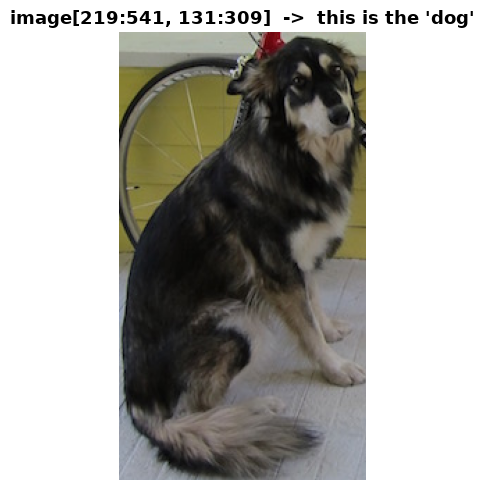

In [16]:
# NumPy slicing order is [y_start:y_end, x_start:x_end]
crop = image[y1:y2, x1:x2]

print(f"Cropped region shape: {crop.shape}")
show(crop, f"image[{y1}:{y2}, {x1}:{x2}]  ->  this is the '{class_name}'", figsize=(5, 5))

---

# 8 · Understanding confidence scores 📊

> The **confidence score** represents how confident the model is that a
> detected object belongs to the predicted class.

It always sits between `0.0` and `1.0`, and we show it to humans as a
percentage:

```text
0.94  ->  94 %      very confident
0.87  ->  87 %      confident
0.61  ->  61 %      "maybe?"
0.09  ->   9 %      almost certainly a mistake
```

A rough reading guide:

| Score | Read it as |
|---|---|
| `0.90 – 1.00` | 🟢 The model is very sure |
| `0.60 – 0.90` | 🟡 Probably right |
| `0.30 – 0.60` | 🟠 Shaky — verify before trusting |
| `0.00 – 0.30` | 🔴 Usually noise / false positives |

⚠️ Confidence is **not** a probability of being correct in the statistical
sense. It is the model's own internal score. A model can be confidently wrong.

### Print every detection with a clean loop

Now we combine everything: loop over the detections and print
**class + confidence + box** for each one.

In [17]:
print(f"YOLO found {len(result.boxes)} objects\n")
print(f"{'#':<3}{'CLASS':<14}{'CONFIDENCE':<14}{'BOUNDING BOX (x1, y1, x2, y2)'}")
print("─" * 74)

# Iterating over result.boxes gives us one Box at a time
for i, box in enumerate(result.boxes):
    # Every attribute is a 1-element tensor for a single box -> take [0]
    x1, y1, x2, y2 = [int(v) for v in box.xyxy[0]]
    confidence     = float(box.conf[0])
    class_id       = int(box.cls[0])
    class_name     = result.names[class_id]

    print(f"{i:<3}{class_name:<14}{confidence:.2f}  ({confidence*100:4.1f}%)  "
          f"({x1}, {y1}, {x2}, {y2})")

print("─" * 74)

YOLO found 4 objects



#  CLASS         CONFIDENCE    BOUNDING BOX (x1, y1, x2, y2)
──────────────────────────────────────────────────────────────────────────
0  dog           0.91  (90.8%)  (131, 219, 309, 541)
1  bicycle       0.89  (88.9%)  (130, 139, 568, 420)


2  car           0.53  (53.1%)  (467, 74, 692, 171)
3  truck         0.51  (50.9%)  (467, 74, 692, 171)
──────────────────────────────────────────────────────────────────────────


### The same thing as a little bar chart

Numbers are abstract — a bar makes the difference obvious.

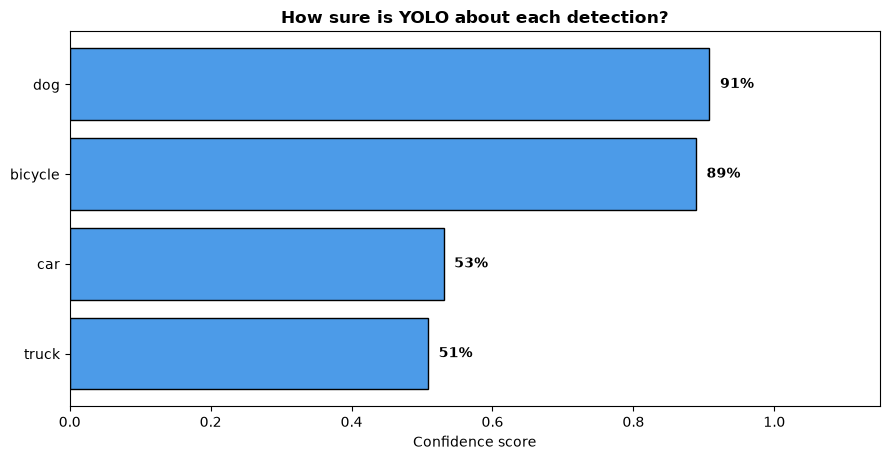

In [18]:
# Collect labels and scores for plotting
labels = [f"{result.names[int(b.cls[0])]}" for b in result.boxes]
scores = [float(b.conf[0]) for b in result.boxes]

# Sort from most to least confident so the chart reads top-down
order  = np.argsort(scores)
labels = [labels[i] for i in order]
scores = [scores[i] for i in order]

plt.figure(figsize=(9, 0.8 * len(labels) + 1.5))
bars = plt.barh(labels, scores, color="#4C9BE8", edgecolor="black")

# Write the percentage at the end of each bar
for bar, s in zip(bars, scores):
    plt.text(s + 0.015, bar.get_y() + bar.get_height() / 2,
             f"{s*100:.0f}%", va="center", fontweight="bold")

plt.xlim(0, 1.15)
plt.xlabel("Confidence score")
plt.title("How sure is YOLO about each detection?", fontweight="bold")
plt.tight_layout()
plt.show()

✋ **Discuss:** which detections would you actually trust in a real product?
Would you ship a feature built on a 51 % detection?

---

# 9 · Draw the bounding boxes **manually** 🎨

This section exists so that you never think of the boxes as magic.

> **A bounding box is just a rectangle drawn from 4 numbers the model
> predicted.** Nothing more.

```text
    YOLO prediction
          │
          ▼
    [x1, y1, x2, y2]
          │
          ▼
      cv2.rectangle()
          │
          ▼
      Bounding box on screen
```

### The two OpenCV functions we need

```python
cv2.rectangle(img, (x1, y1), (x2, y2), color, thickness)
cv2.putText(img, text, (x, y), font, scale, color, thickness)
```

Remember colours in OpenCV are **(B, G, R)**, so pure red is `(0, 0, 255)`.

### Step 1 — draw a single box, slowly

Before the loop, let's draw just **one** rectangle so every argument is clear.

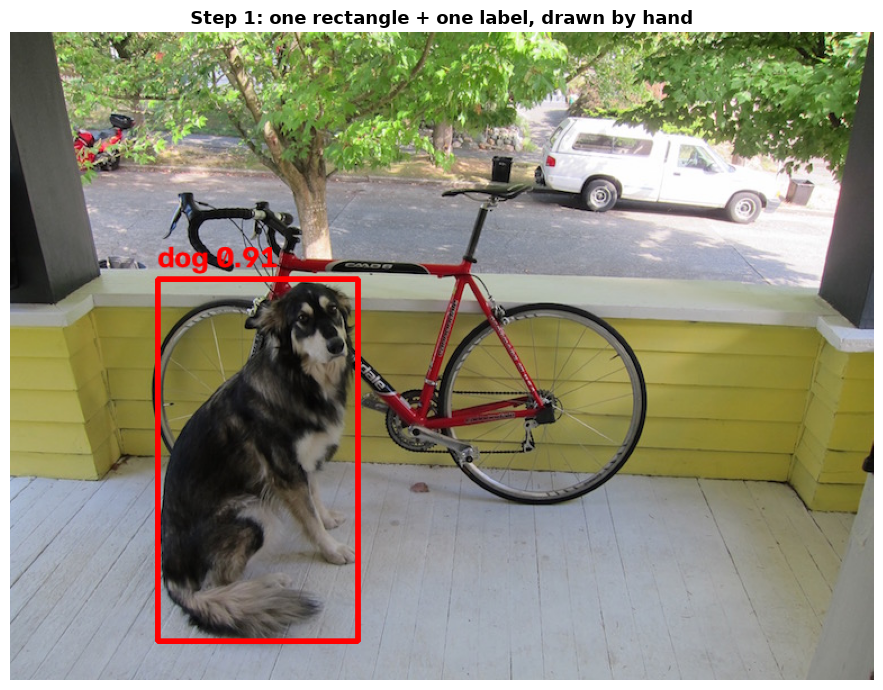

In [19]:
# ALWAYS work on a copy - cv2 drawing functions modify the array in place!
demo = image.copy()

# Pull out detection #0 again
x1, y1, x2, y2 = [int(v) for v in result.boxes.xyxy[0]]
class_name     = result.names[int(result.boxes.cls[0])]
confidence     = float(result.boxes.conf[0])

# 1) The rectangle: top-left corner, bottom-right corner, colour (BGR), thickness
cv2.rectangle(demo, (x1, y1), (x2, y2), (0, 0, 255), 3)

# 2) The text label, placed just above the top-left corner (y1 - 10)
label = f"{class_name} {confidence:.2f}"
cv2.putText(demo, label, (x1, y1 - 10),
            cv2.FONT_HERSHEY_SIMPLEX,  # font
            0.9,                       # font scale
            (0, 0, 255),               # colour (BGR) - red
            2)                         # thickness

show(demo, "Step 1: one rectangle + one label, drawn by hand")

### Step 2 — a colour per class

If every box is red, overlapping objects are hard to read. Let's give each
**class ID** its own stable colour.

In [20]:
# A palette of bright, easy-to-tell-apart colours, written as (R, G, B)
PALETTE_RGB = [
    (255,  56,  56), (255, 112,  31), (255, 178,  29), (207, 210,  49),
    ( 72, 249,  10), ( 26, 147,  52), (  0, 212, 187), (  0, 194, 255),
    (100, 115, 255), (132,  56, 255), (203,  56, 255), (255,  55, 199),
]

def color_for(class_id):
    '''Return a stable BGR colour for a given class ID.'''
    # Modulo means class 0 and class 12 share a colour - fine for 4-6 objects,
    # and it guarantees the SAME class always gets the SAME colour.
    r, g, b = PALETTE_RGB[int(class_id) % len(PALETTE_RGB)]
    return (b, g, r)          # OpenCV wants BGR, not RGB

# Preview a few
for cid in [0, 1, 2, 16]:
    print(f"class {model.names[cid]:<10} -> BGR {color_for(cid)}")

class person     -> BGR (56, 56, 255)
class bicycle    -> BGR (31, 112, 255)
class car        -> BGR (29, 178, 255)
class dog        -> BGR (10, 249, 72)


### Step 3 — loop over **all** detections

Same five steps for every object:

1. Get the coordinates
2. Get the class name
3. Get the confidence
4. Draw the rectangle
5. Draw the label

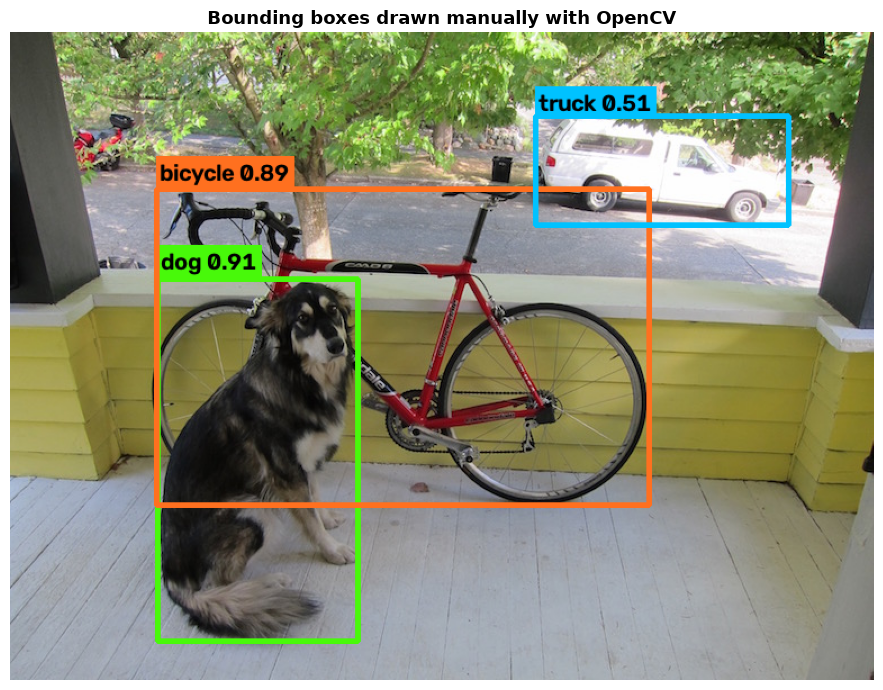

In [21]:
# Start from a clean copy of the original image
annotated_manual = image.copy()

for box in result.boxes:
    # 1) coordinates -> ints, because pixels are whole numbers
    x1, y1, x2, y2 = [int(v) for v in box.xyxy[0]]

    # 2) class name
    class_id   = int(box.cls[0])
    class_name = result.names[class_id]

    # 3) confidence
    confidence = float(box.conf[0])

    # a colour for this class
    color = color_for(class_id)

    # 4) the bounding box itself
    cv2.rectangle(annotated_manual, (x1, y1), (x2, y2), color, 3)

    # 5) the label -> "dog 0.91"
    label = f"{class_name} {confidence:.2f}"

    # Measure the text so we can paint a filled background behind it.
    # Without this, light text on a light image is unreadable.
    (text_w, text_h), baseline = cv2.getTextSize(
        label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2)

    # Filled rectangle sitting on top of the box, used as a label background
    cv2.rectangle(annotated_manual,
                  (x1, y1 - text_h - baseline - 6),
                  (x1 + text_w + 6, y1),
                  color, -1)                      # -1 thickness = filled

    # The text on top of that background, in black for contrast
    cv2.putText(annotated_manual, label,
                (x1 + 3, y1 - baseline - 3),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2)

show(annotated_manual, "Bounding boxes drawn manually with OpenCV")

🎉 **You just built a detection visualiser from scratch.**

Look back at the loop: there is no AI in it at all. It is `cv2.rectangle` and
`cv2.putText` fed by the numbers YOLO predicted. That is the whole trick.

---

# 10 · Manual drawing vs. YOLO's built-in `.plot()`

Now that you know what happens underneath, here is the shortcut you will
actually use in real projects — a single method that returns an annotated
image:

```python
annotated_image = result.plot()
```

Return type : ndarray
Shape       : (576, 768, 3)  (same size as the input)


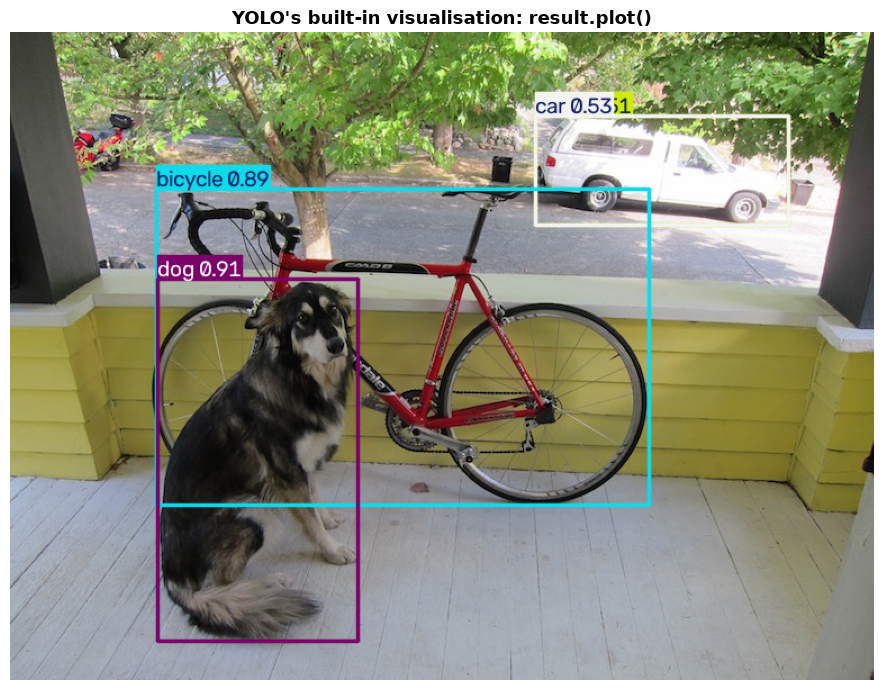

In [22]:
# .plot() returns a NEW annotated image as a BGR NumPy array
annotated_builtin = result.plot()

print("Return type :", type(annotated_builtin).__name__)
print("Shape       :", annotated_builtin.shape, " (same size as the input)")

show(annotated_builtin, "YOLO's built-in visualisation: result.plot()")

### Side by side

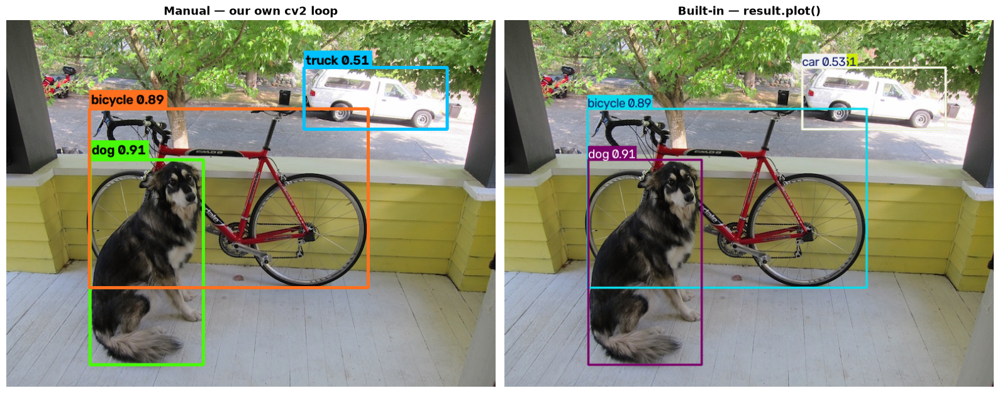

In [23]:
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

axes[0].imshow(cv2.cvtColor(annotated_manual, cv2.COLOR_BGR2RGB))
axes[0].set_title("Manual — our own cv2 loop", fontsize=13, fontweight="bold")
axes[0].axis("off")

axes[1].imshow(cv2.cvtColor(annotated_builtin, cv2.COLOR_BGR2RGB))
axes[1].set_title("Built-in — result.plot()", fontsize=13, fontweight="bold")
axes[1].axis("off")

plt.tight_layout()
plt.show()

> YOLO already provides visualisation utilities, so in real projects we
> usually don't need to manually draw everything ourselves.
> **We did it manually first so we understand what is happening underneath.**

That distinction matters. `.plot()` is convenient, but the moment you need to
do something it doesn't do — blur every detected face, count people crossing a
line, crop out each object, send the boxes to another service — you are back
to the loop from section 9. **The loop is the real skill.**

---

# 11 · The confidence threshold 🎚️

YOLO internally proposes *many* candidate boxes — most of them rubbish. It
only reports the ones scoring above a **confidence threshold**.

```python
results = model(image, conf=0.5)   # keep only detections >= 50 % confidence
```

The default in Ultralytics is `conf=0.25`.

```text
  conf = 0.05   ┃████████████████████┃  many detections, lots of junk
  conf = 0.25   ┃████████████┃          the default
  conf = 0.50   ┃████████┃              balanced
  conf = 0.80   ┃████┃                  only the very sure ones
```

Let's actually run it and count.

In [24]:
def detect_and_count(img, conf):
    '''Run YOLO at a given confidence threshold and report what survived.'''
    res = model(img, conf=conf, verbose=False)[0]
    found = [(res.names[int(b.cls[0])], float(b.conf[0])) for b in res.boxes]
    return res, found


for threshold in [0.05, 0.25, 0.50, 0.80]:
    res, found = detect_and_count(image, threshold)
    print(f"conf = {threshold:.2f}  ->  {len(found)} detections")
    for name, score in found:
        print(f"                    {name:<10} {score:.2f}")
    print()

conf = 0.05  ->  7 detections
                    dog        0.91
                    bicycle    0.89
                    car        0.53
                    truck      0.51
                    tv         0.09
                    bicycle    0.08
                    bicycle    0.06

conf = 0.25  ->  4 detections
                    dog        0.91
                    bicycle    0.89
                    car        0.53
                    truck      0.51

conf = 0.50  ->  4 detections
                    dog        0.91
                    bicycle    0.89
                    car        0.53
                    truck      0.51



conf = 0.80  ->  2 detections
                    dog        0.91
                    bicycle    0.89



### See it, don't just read it

The same image, four thresholds, side by side.

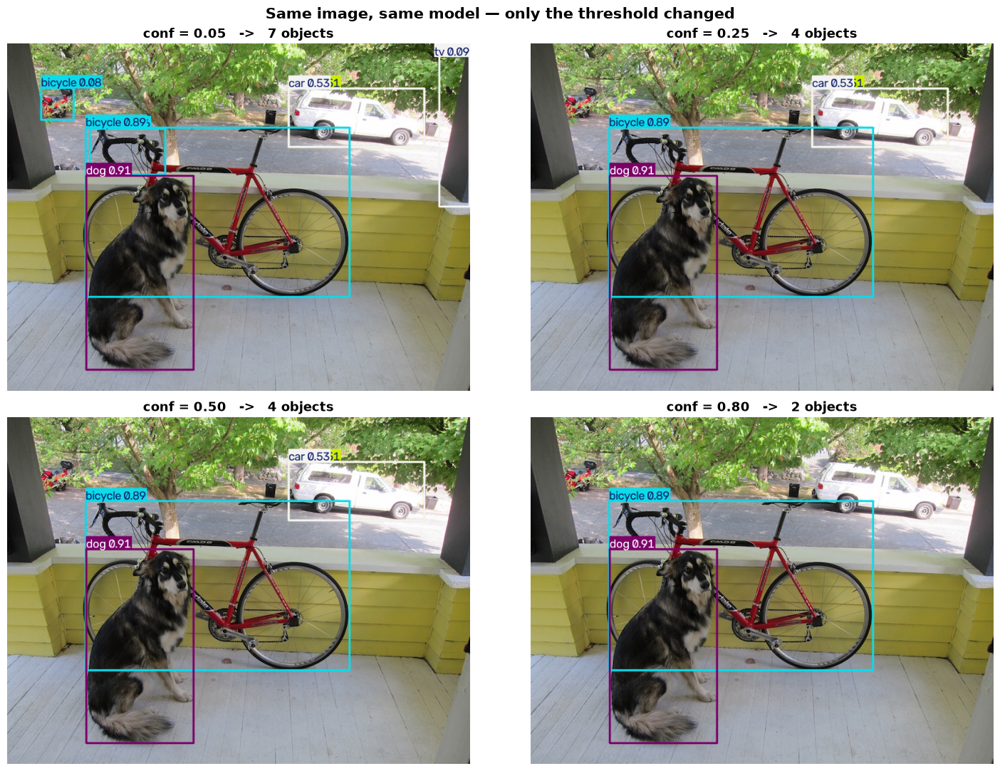

In [25]:
thresholds = [0.05, 0.25, 0.50, 0.80]

fig, axes = plt.subplots(2, 2, figsize=(15, 11))

for ax, threshold in zip(axes.ravel(), thresholds):
    res = model(image, conf=threshold, verbose=False)[0]
    ax.imshow(cv2.cvtColor(res.plot(), cv2.COLOR_BGR2RGB))
    ax.set_title(f"conf = {threshold:.2f}   ->   {len(res.boxes)} objects",
                 fontsize=13, fontweight="bold")
    ax.axis("off")

plt.suptitle("Same image, same model — only the threshold changed",
             fontsize=15, fontweight="bold")
plt.tight_layout()
plt.show()

### The trade-off — the single most important idea in this section

> **Lower threshold** → more detections, but potentially more **false positives**
> (things reported that are not really there).

> **Higher threshold** → fewer detections, but generally **more confident**
> predictions — at the risk of **missing** real objects (false negatives).

```text
        LOW conf                          HIGH conf
   ┌──────────────────┐             ┌──────────────────┐
   │ catches almost   │             │ only rock-solid  │
   │ everything real  │             │ detections       │
   │        +         │             │        +         │
   │ lots of garbage  │             │ misses real ones │
   └──────────────────┘             └──────────────────┘
      "don't miss anything"           "don't be wrong"
```

There is **no universally correct value**. It depends on your product:

| Application | Sensible choice | Why |
|---|---|---|
| Medical / safety screening | **Low** threshold | Missing a real case is far worse than a false alarm |
| Auto-publishing photo tags | **High** threshold | A wrong public label is embarrassing |
| General demo / prototype | `0.25` – `0.5` | The usual sweet spot |

---

# 12 · 🧪 Mini experiment — your turn

Run the cell below, then **change `MY_THRESHOLD`** and run it again. Try at
least `0.25`, `0.50` and `0.80`.

Threshold 0.25  ->  4 objects detected
   dog          0.91
   bicycle      0.89
   car          0.53
   truck        0.51


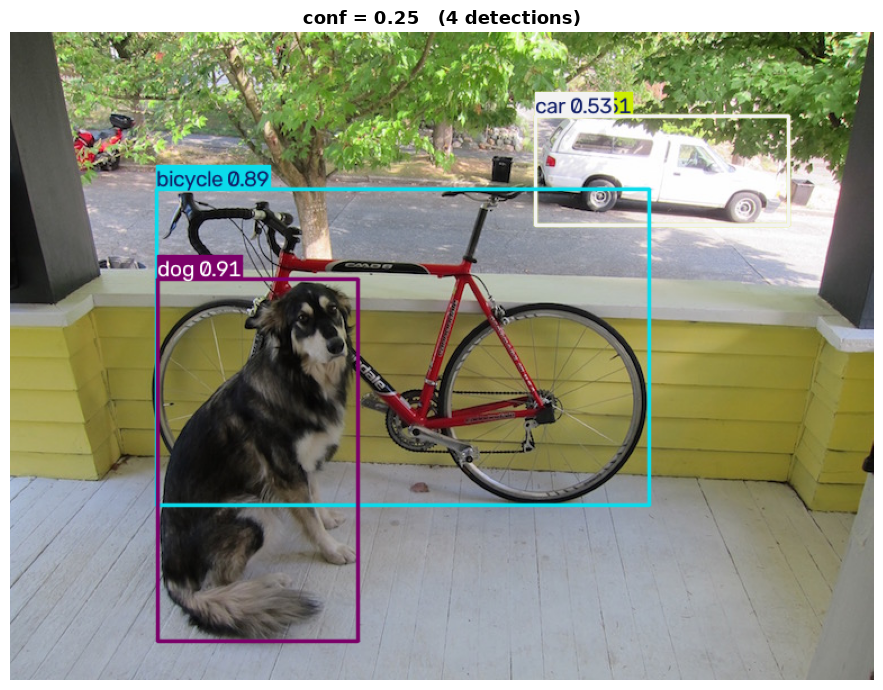

In [26]:
# ⬇️  CHANGE THIS VALUE AND RE-RUN THE CELL  ⬇️
MY_THRESHOLD = 0.25
# ⬆️  try 0.25, then 0.50, then 0.80, then something silly like 0.99  ⬆️

res = model(image, conf=MY_THRESHOLD, verbose=False)[0]

print(f"Threshold {MY_THRESHOLD}  ->  {len(res.boxes)} objects detected")
for b in res.boxes:
    print(f"   {res.names[int(b.cls[0])]:<12} {float(b.conf[0]):.2f}")

show(res.plot(), f"conf = {MY_THRESHOLD}   ({len(res.boxes)} detections)")

## 📝 Answer these in your notes

Run the experiment at `conf = 0.25`, `0.50` and `0.80`, then answer:

1. **How many objects were detected** at each threshold?
2. **Which objects disappeared** when the threshold increased?
3. **Why do you think they disappeared?**
4. Between `0.25` and `0.50` — did anything change? What does that tell you
   about where this image's detections actually sit?
5. **Which threshold gives the most useful result** for this particular image?
6. Now try `conf = 0.05`. Do you see anything the model got *wrong*?
   What would that cost you in a real product?

*(Discuss with the person next to you before we go through it together.)*

---

# 13 · Run YOLO on a different image

The point here: **the same pretrained model, with no changes at all**, detects
a completely different set of objects. That is the power of a pretrained
general-purpose detector.

We'll grab a sample street scene. If you have no internet, drop any photo next
to this notebook and change `SECOND_IMAGE` to its filename.

Shape: (1080, 810, 3)


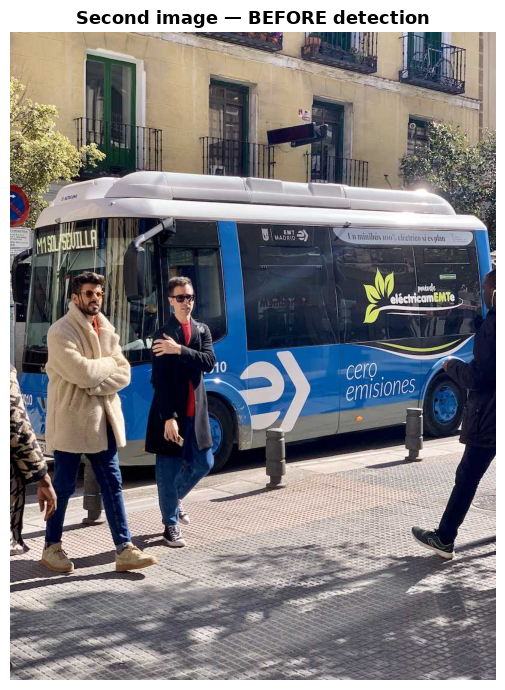

In [27]:
import urllib.request
from pathlib import Path

SECOND_IMAGE = "bus.jpg"

# Download a sample street photo once (skip if it is already here)
if not Path(SECOND_IMAGE).exists():
    try:
        urllib.request.urlretrieve("https://ultralytics.com/images/bus.jpg", SECOND_IMAGE)
        print(f"Downloaded {SECOND_IMAGE}")
    except Exception as e:
        print(f"⚠️  Download failed ({e}). Put your own image here and rename SECOND_IMAGE.")

image2 = cv2.imread(SECOND_IMAGE)
if image2 is None:
    raise FileNotFoundError(f"Could not read '{SECOND_IMAGE}'.")

print("Shape:", image2.shape)
show(image2, "Second image — BEFORE detection")

## ✋ Predict again!

> **What will YOLO find here?**
>
> * How many objects?
> * Which classes?
> * Will it detect the people in the background as reliably as the ones in front?
> * Anything in this scene that is **not** one of the 80 classes?

Now run it.

In [28]:
result2 = model(image2, verbose=False)[0]

print(f"YOLO found {len(result2.boxes)} objects\n")
print(f"{'#':<3}{'CLASS':<14}{'CONFIDENCE':<14}{'BOUNDING BOX'}")
print("─" * 66)
for i, box in enumerate(result2.boxes):
    x1, y1, x2, y2 = [int(v) for v in box.xyxy[0]]
    print(f"{i:<3}{result2.names[int(box.cls[0])]:<14}"
          f"{float(box.conf[0]):.2f}  ({float(box.conf[0])*100:4.1f}%)  "
          f"({x1}, {y1}, {x2}, {y2})")
print("─" * 66)

YOLO found 6 objects

#  CLASS         CONFIDENCE    BOUNDING BOX
──────────────────────────────────────────────────────────────────
0  bus           0.87  (87.3%)  (22, 231, 805, 756)
1  person        0.87  (86.6%)  (48, 398, 245, 902)
2  person        0.85  (85.3%)  (669, 392, 809, 877)
3  person        0.83  (82.5%)  (221, 405, 344, 857)
4  person        0.26  (26.1%)  (0, 550, 63, 873)
5  stop sign     0.26  (25.5%)  (0, 254, 32, 324)
──────────────────────────────────────────────────────────────────


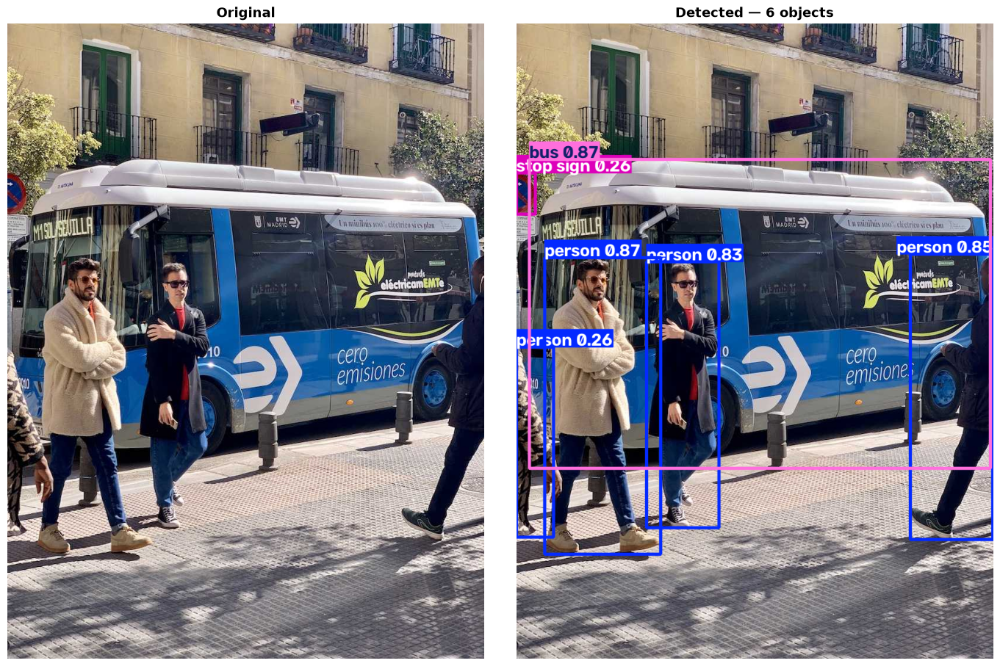

In [29]:
# Original vs detected, side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 9))

axes[0].imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))
axes[0].set_title("Original", fontsize=13, fontweight="bold")
axes[0].axis("off")

axes[1].imshow(cv2.cvtColor(result2.plot(), cv2.COLOR_BGR2RGB))
axes[1].set_title(f"Detected — {len(result2.boxes)} objects",
                  fontsize=13, fontweight="bold")
axes[1].axis("off")

plt.tight_layout()
plt.show()

### 🔁 Notice what did **not** change

* We did **not** retrain anything.
* We did **not** tell the model there would be people or a bus.
* We used the **exact same `model` object** from section 3.

One pretrained model, 80 classes, any image. Also notice how confidence drops
for the small, partly hidden people at the back — **distance, size and
occlusion all lower confidence**.

In [30]:
# Quick confidence sweep on the second image too
for threshold in [0.25, 0.50, 0.85]:
    r = model(image2, conf=threshold, verbose=False)[0]
    names = [r.names[int(b.cls[0])] for b in r.boxes]
    print(f"conf = {threshold:.2f}  ->  {len(names)} objects: {names}")

conf = 0.25  ->  6 objects: ['bus', 'person', 'person', 'person', 'person', 'stop sign']
conf = 0.50  ->  4 objects: ['bus', 'person', 'person', 'person']
conf = 0.85  ->  3 objects: ['bus', 'person', 'person']


---

# 14 · 🎬 Optional — YOLO on video

A video is just **a sequence of images**. So detection on video is detection on
an image, repeated:

```text
        Video
          │
          ▼
   Frame 1  →  YOLO  →  detections
   Frame 2  →  YOLO  →  detections
   Frame 3  →  YOLO  →  detections
      ...
          │
          ▼
   Object detection over time
```

That's the whole idea. There is no special "video model".

Below we build a tiny video by panning a window across our image (so the cell
works with no internet and no extra files), then run YOLO **frame by frame**.

In [31]:
# ── Build a small 12-frame video by panning across our image ──────────────
VIDEO_PATH = "sample_pan.mp4"

n_frames  = 12
crop_w    = int(image.shape[1] * 0.75)      # window is 75 % of the width
crop_h    = image.shape[0]
max_shift = image.shape[1] - crop_w

writer = cv2.VideoWriter(VIDEO_PATH,
                         cv2.VideoWriter_fourcc(*"mp4v"),
                         6,                       # fps
                         (crop_w, crop_h))

for i in range(n_frames):
    x_offset = int(max_shift * i / (n_frames - 1))
    writer.write(image[:, x_offset:x_offset + crop_w])
writer.release()

print(f"✅ Wrote {n_frames} frames to {VIDEO_PATH}  ({crop_w}x{crop_h} @ 6 fps)")

✅ Wrote 12 frames to sample_pan.mp4  (576x576 @ 6 fps)


In [32]:
# ── Read the video back and run YOLO on every frame ───────────────────────
cap = cv2.VideoCapture(VIDEO_PATH)

annotated_frames = []
frame_index      = 0

while True:
    ok, frame = cap.read()      # read ONE frame
    if not ok:                  # False when the video ends
        break

    # ⬇️ exactly the same call we used on a still image
    frame_result = model(frame, conf=0.4, verbose=False)[0]

    annotated_frames.append(frame_result.plot())
    names = [frame_result.names[int(b.cls[0])] for b in frame_result.boxes]
    print(f"frame {frame_index:>2}: {len(names)} objects  {names}")
    frame_index += 1

cap.release()
print(f"\n✅ Processed {len(annotated_frames)} frames")

frame  0: 3 objects  ['dog', 'bicycle', 'car']
frame  1: 3 objects  ['dog', 'bicycle', 'car']
frame  2: 3 objects  ['dog', 'bicycle', 'car']


frame  3: 3 objects  ['dog', 'bicycle', 'car']
frame  4: 3 objects  ['dog', 'bicycle', 'car']


frame  5: 3 objects  ['dog', 'bicycle', 'car']
frame  6: 3 objects  ['dog', 'bicycle', 'car']


frame  7: 3 objects  ['dog', 'bicycle', 'car']
frame  8: 4 objects  ['dog', 'bicycle', 'car', 'truck']


frame  9: 3 objects  ['dog', 'bicycle', 'car']
frame 10: 4 objects  ['dog', 'bicycle', 'car', 'truck']


frame 11: 4 objects  ['dog', 'bicycle', 'car', 'truck']

✅ Processed 12 frames


### The result, as a filmstrip

Notebooks can't easily play video inline, so we show a few annotated frames in
order. Watch the boxes slide across the frame — and notice that some objects
**flicker in and out** between frames. Their confidence is hovering right
around our `conf=0.4` threshold, so tiny changes flip them on and off. Real
video systems fix this with **tracking**, which links detections across frames.

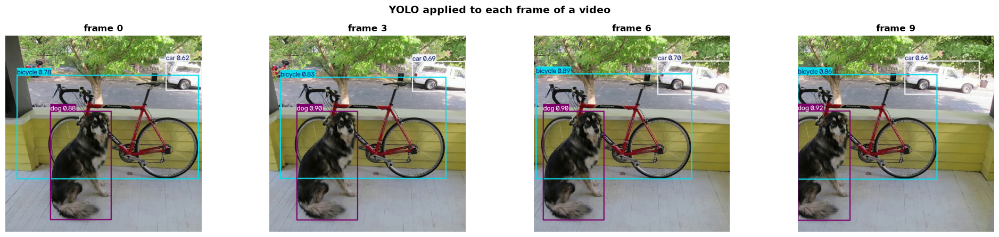

In [33]:
picked = annotated_frames[::3][:4]      # every 3rd frame, up to 4 of them

fig, axes = plt.subplots(1, len(picked), figsize=(5 * len(picked), 4.5))
for ax, (i, f) in zip(np.atleast_1d(axes), enumerate(picked)):
    ax.imshow(cv2.cvtColor(f, cv2.COLOR_BGR2RGB))
    ax.set_title(f"frame {i * 3}", fontsize=12, fontweight="bold")
    ax.axis("off")

plt.suptitle("YOLO applied to each frame of a video", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

### In a real project you would just write

```python
# Ultralytics handles the whole read → detect → write loop for you.
# Saves an annotated video to runs/detect/predict/
model.predict(source="my_video.mp4", conf=0.4, save=True)
```

That's the *convenience* version — but you now know it's just the loop above.

---

# 15 · 🚀 Optional — try YOLO with your webcam

> **This section only works in a *local* Jupyter install with a webcam.**
> It will **not** work in Google Colab, on a remote server, or in a container.
> Nothing later in this notebook depends on it — skip it freely.

It opens a separate OpenCV window. **Press `q` to quit.**
If the window ever freezes, run the cleanup cell right after it.

In [34]:
# ── OPTIONAL WEBCAM DEMO — set to True only on a local machine ────────────
RUN_WEBCAM = False

if RUN_WEBCAM:
    cap = cv2.VideoCapture(0)          # 0 = default camera

    if not cap.isOpened():
        print("❌ Could not open the webcam.")
    else:
        print("Webcam running — click the window and press 'q' to quit.")
        while True:
            ok, frame = cap.read()
            if not ok:
                break

            # Same one-line inference, now on a live frame
            live = model(frame, conf=0.5, verbose=False)[0]

            cv2.imshow("YOLO webcam (press q to quit)", live.plot())
            if cv2.waitKey(1) & 0xFF == ord("q"):
                break

        cap.release()
        cv2.destroyAllWindows()
        print("Webcam stopped ✅")
else:
    print("Webcam demo skipped. Set RUN_WEBCAM = True to try it locally.")

Webcam demo skipped. Set RUN_WEBCAM = True to try it locally.


In [35]:
# 🧹 Emergency cleanup - run this if an OpenCV window gets stuck
cv2.destroyAllWindows()
print("Windows closed")

Windows closed


---

# 16 · 🧠 The final mental model

Everything we did today collapses into this one picture:

```text
                        IMAGE
                          │
                          ▼
                        YOLO
                          │
                          ▼
                      DETECTIONS
                          │
                          ▼
        ┌───────────────────────────────┐
        │  Bounding box                 │   where?
        │  Class / Label                │   what?
        │  Confidence score             │   how sure?
        └───────────────────────────────┘
                          │
                          ▼
                    VISUALIZATION
```

## What YOLO gives us

| Question | Answer | In code |
|---|---|---|
| **Where?** | 📦 Bounding box | `result.boxes.xyxy` |
| **What?** | 🏷️ Class | `result.boxes.cls` → `result.names[id]` |
| **How confident?** | 📊 Confidence score | `result.boxes.conf` |

## The whole notebook in 12 lines

If you remember nothing else, remember this:

```python
from ultralytics import YOLO
import cv2

model  = YOLO("yolov8n.pt")             # 1. pretrained model
image  = cv2.imread("dog.jpg")          # 2. an image
result = model(image, conf=0.25)[0]     # 3. inference

for box in result.boxes:                # 4. read the predictions
    x1, y1, x2, y2 = [int(v) for v in box.xyxy[0]]
    name  = result.names[int(box.cls[0])]
    score = float(box.conf[0])
    cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.putText(image, f"{name} {score:.2f}", (x1, y1 - 8),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)
```

## ✅ Session checklist

Tick these off before you leave:

- [ ] I can explain the difference between **classification** and **detection**
- [ ] I know what `pretrained`, `inference` and `training` mean
- [ ] I can load a YOLO model and run it on an image
- [ ] I can read `result.boxes.xyxy`, `.conf` and `.cls`
- [ ] I can turn a class **ID** into a class **name**
- [ ] I can draw a box myself with `cv2.rectangle()` and `cv2.putText()`
- [ ] I can explain what happens when the confidence threshold goes up or down

## 🏋️ Take-home challenges

1. **Count** how many `person` objects are in an image, ignoring all other classes.
2. **Crop and save** every detected object into its own image file.
3. Feed YOLO **your own photo** and find one object it gets embarrassingly wrong.
4. Find something YOLO **cannot** detect — and say which of the 80 classes it
   confused it with.
5. Print detections **sorted by box area** instead of by confidence.
   *(Hint: `area = (x2 - x1) * (y2 - y1)`)*

## ➡️ What's next

We used a model trained on someone else's 80 classes. Next we look at
**training detection on your own data** — your own classes, your own labels.

---

*AI Builders Bootcamp — Computer Vision · Session 05 · Object Detection with YOLO*